In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys # Python system library needed to load custom functions
import math # module with access to mathematical functions
import os # for changing the directory

import time
import numpy as np  # for performing calculations on numerical arrays
import pandas as pd  # home of the DataFrame construct, _the_ most important object for Data Science

from IPython.display import Audio as AudioI # for listening to our insects
from scipy.fft import fft # function to calculate Fast Fourier Transform

import matplotlib.pyplot as plt  # allows creation of insightful plots
import seaborn as sns # another library to make even more beautiful plots

sys.path.append('../src_old') # add the source directory to the PYTHONPATH. This allows to import local functions and modules.
# enable rendering plots under the code cell that created it
%matplotlib inline

from eda_utils import show_sampling, signal_generator, plot_random_spec, plot_spec, plot_waveform # functions to create plots for and from audio data
from gdsc_utils import download_directory, PROJECT_DIR # function to download GDSC data from S3 bucket and our root directory
from config import DEFAULT_BUCKET  # S3 bucket with the GDSC data

from datasets import load_dataset, Audio 

import librosa
import soundfile as sf

import torchaudio

os.chdir(PROJECT_DIR) # changing our directory to root

In [4]:
import sagemaker                                                                       # dedicated sagemaker library to execute training jobs
import boto3 

from config import DEFAULT_BUCKET, DEFAULT_REGION  
from gdsc_utils import upload_to_s3, PROJECT_DIR                                        # functions to create S3 buckets and to help with downloading models. Importing our root directory
os.chdir(PROJECT_DIR)

In [5]:
import shutil
import tqdm

In [6]:
from zipfile import ZipFile
 

In [7]:
os.getcwd()

'/root/data/experiments'

In [11]:
 # loading the temp.zip and creating a zip object
with ZipFile('/root/data/pretrained_models/beats.zip', 'r') as zObject:
  
    # Extracting all the members of the zip 
    # into a specific location.
    zObject.extractall(
        path='/root/data/pretrained_models')

In [9]:
sys.path.append('../pretrained_models/beats')

In [10]:
import torch
from Tokenizers import TokenizersConfig, Tokenizers

In [11]:
os.getcwd()

'/root/data/experiments'

In [13]:
# load the pre-trained checkpoints
checkpoint = torch.load('/root/data/pretrained_models/beats/Tokenizer_iter2.pt')
cfg = TokenizersConfig(checkpoint['cfg'])

In [14]:
BEATs_tokenizer = Tokenizers(cfg)
BEATs_tokenizer.load_state_dict(checkpoint['model'])
BEATs_tokenizer.eval()

Tokenizers(
  (post_extract_proj): Linear(in_features=512, out_features=768, bias=True)
  (patch_embedding): Conv2d(1, 512, kernel_size=(16, 16), stride=(16, 16), bias=False)
  (dropout_input): Dropout(p=0.1, inplace=False)
  (encoder): TransformerEncoder(
    (pos_conv): Sequential(
      (0): Conv1d(768, 768, kernel_size=(128,), stride=(1,), padding=(64,), groups=16)
      (1): SamePad()
      (2): GELU(approximate='none')
    )
    (layers): ModuleList(
      (0): TransformerSentenceEncoderLayer(
        (self_attn): MultiheadAttention(
          (dropout_module): Dropout(p=0.1, inplace=False)
          (relative_attention_bias): Embedding(320, 12)
          (k_proj): Linear(in_features=768, out_features=768, bias=True)
          (v_proj): Linear(in_features=768, out_features=768, bias=True)
          (q_proj): Linear(in_features=768, out_features=768, bias=True)
          (out_proj): Linear(in_features=768, out_features=768, bias=True)
          (grep_linear): Linear(in_features=64

In [15]:
# tokenize the audio and generate the labels
audio_input_16khz = torch.randn(1, 10000)
padding_mask = torch.zeros(1, 10000).bool()

labels = BEATs_tokenizer.extract_labels(audio_input_16khz, padding_mask=padding_mask)

In [18]:
labels

tensor([  41,   47, 1008,  809,  883,  375,  496,  375, 1002,  809,  447,  809,
         916,  375,  375,  375,  403,  635,  280,  951,  916,  496,  496,  496])

In [8]:
# example_path = 'data/train/Chorthippusbiguttulus_XC751834-dat031-007_edit3.wav'
# plot_waveform(example_path)

In [9]:
#plot_spec([example_path])

In [10]:
#AudioI(example_path)

In [11]:
train_path = 'data/train'

In [12]:
train_dataset = load_dataset("audiofolder", data_dir=train_path)  #.get('train').shuffle(seed = 42)

Resolving data files:   0%|          | 0/1753 [00:00<?, ?it/s]

Extracting data files: 0it [00:00, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset audiofolder downloaded and prepared to /root/.cache/huggingface/datasets/audiofolder/default-9540d76c2719c5c2/0.0.0/6cbdd16f8688354c63b4e2a36e1585d05de285023ee6443ffd71c4182055c0fc. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
train_dataset

DatasetDict({
    train: Dataset({
        features: ['audio', 'label'],
        num_rows: 1752
    })
})

In [14]:
train_dataset = train_dataset.get('train')

In [15]:
train_dataset[23]

{'audio': {'path': '/root/data/data/train/Aleetacurvicosta_GBIF1990476941_IN19580258_29143.wav',
  'array': array([ 0.        ,  0.        ,  0.        , ..., -0.04556274,
          0.0329895 , -0.02139282]),
  'sampling_rate': 44100},
 'label': 1}

In [16]:
train_dataset[230]['audio']['array'].shape

(882000,)

In [17]:
lab = train_dataset['label']

In [18]:
metadata = pd.read_csv('/root/data/data/metadata.csv')

In [15]:
#x = train_dataset.map(lambda x: x['audio']['path'], remove_columns="audio", batched=True, batch_size = 2)

In [16]:
# path = [train_dataset[i]['audio']['path'] for i in range(train_dataset.shape[0])]
# file_name = [p[len('/root/data/data/train/'):] for p in path]

In [17]:
#path[:10]

In [ ]:
#signal = [train_dataset[i]['audio']['array'] for i in range(train_dataset.shape[0])]

In [ ]:
#df_trn = pd.DataFrame(train_dataset)  #kernel zdycha!!!

In [11]:
audio_file = 'data/train/Achetadomesticus_XC489192-Achetadomesticus_poland_psz_20140510_22.00h_3498_edit1.wav'

In [12]:
sig, sr = librosa.load(audio_file, sr=None)

In [13]:
AudioI(audio_file)

In [14]:
train_dataset[0]['audio']['array'].shape[0]

352800

In [20]:
def plot_signal(signal, signal_aug, sr):
    fig, ax = plt.subplots(nrows=2)
    librosa.display.waveshow(signal, sr=sr, ax=ax[0])
    ax[0].set(title='Original signal')
    librosa.display.waveshow(signal_aug, sr=sr, ax=ax[1])
    ax[1].set(title='Augmented signal')    
    plt.show()
    

In [21]:
# sig_aug = librosa.effects.time_stretch(y=sig, rate=1.2) #0.8-1.2
# sig_aug= librosa.effects.pitch_shift(y=sig_aug, sr=sr, n_steps=1.5)  #1-2
# sig_aug = random_gain(signal=sig_aug, min_gain=2, max_gain=4) #1.5-3
# sig_aug = white_noise(signal=sig_aug, noise_factor=0.3)   #0.1-0.4

In [41]:
def white_noise(signal, noise_factor_min=0.1, noise_factor_max=0.4, noise_factor=None, seed=123): 

    np.random.seed(seed)
    noise = np.random.normal(0, signal.std(), signal.shape[0])
    if noise_factor is None:
        noise_factor = np.random.uniform(noise_factor_min, noise_factor_max)       
    signal_augmented = signal + noise * noise_factor
    return signal_augmented

In [42]:
def time_stretch(signal, stretch_rate_min=1.05, stretch_rate_max=1.2, stretch_rate=None, seed=123):    
    if (stretch_rate_min) < 1 & (stretch_rate_max > 1):
        raise ValueError("Both 'stretch_rate_min' and 'stretch_rate_max' must be either below 1 or above 1")
    if stretch_rate is None:
        np.random.seed(seed)
        stretch_rate = np.random.uniform(stretch_rate_min, stretch_rate_max)
    return librosa.effects.time_stretch(y=signal, rate=stretch_rate)

In [43]:
def pitch_scale(signal, sr, n_steps_min=1, n_steps_max=2, n_steps=None, seed=123):
    if n_steps is None:
        np.random.seed(seed)
        n_steps = np.random.uniform(n_steps_min, n_steps_max)    
    return librosa.effects.pitch_shift(y=signal, sr=sr, n_steps=n_steps)  

In [44]:
def polarity_inversion(signal):
    return signal * -1

In [45]:
def random_gain(signal, gain_min=1.5, gain_max=3, gain=None, seed=123):
  
    if gain is None:  
        np.random.seed(seed) 
        gain = np.random.uniform(gain_min, gain_max)
    return signal * gain

In [26]:
sig_aug = white_noise(signal=sig)#, noise_factor=0.5)  #0.1-0.4

NameError: name 'sig' is not defined

In [23]:
sf.write("data/augmented_signal.wav", sig_aug, sr)

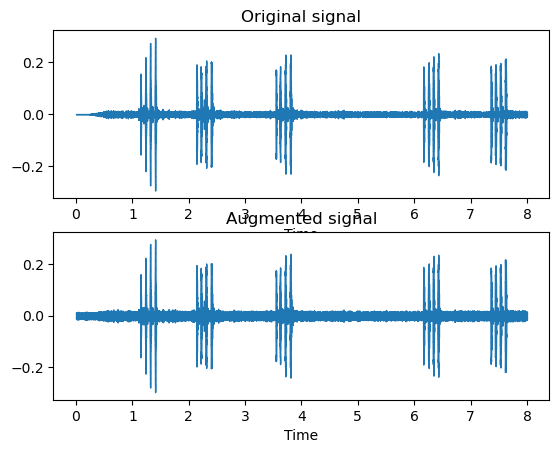

In [24]:
plot_signal(signal=sig, signal_aug=sig_aug, sr=sr)

In [25]:
AudioI('data/train/Achetadomesticus_XC489192-Achetadomesticus_poland_psz_20140510_22.00h_3498_edit1.wav')

In [8]:
AudioI('data/augmented_signal.wav')

In [71]:
sig_aug_stretch = librosa.effects.time_stretch(y=sig, rate=1.2)  #0.8-1.2

In [72]:
sf.write("data/augmented_signal_stretch.wav", sig_aug_stretch, sr)

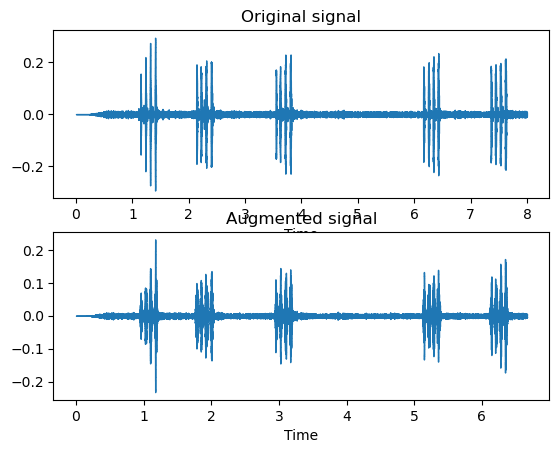

In [73]:
plot_signal(signal=sig, signal_aug=sig_aug_stretch, sr=sr)

In [74]:
AudioI('data/augmented_signal_stretch.wav')

In [88]:
sig_aug_pitch = librosa.effects.pitch_shift(y=sig, sr=sr, n_steps=1.5)   #1-2

In [89]:
sf.write("data/augmented_signal_pitch.wav", sig_aug_pitch, sr)

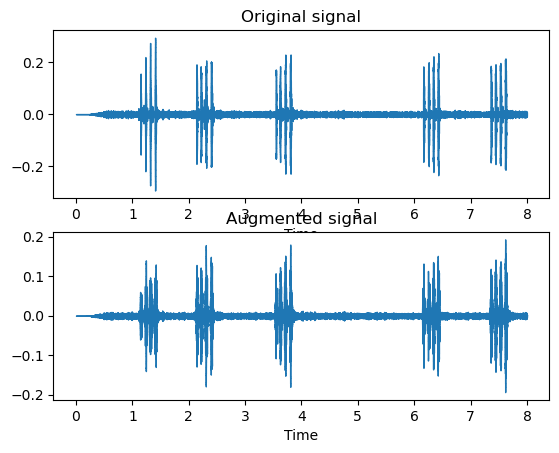

In [90]:
plot_signal(signal=sig, signal_aug=sig_aug_pitch, sr=sr)

In [91]:
AudioI('data/augmented_signal_pitch.wav')

In [95]:
sig_aug_inv = polarity_inversion(signal=sig)

In [97]:
sf.write("data/augmented_signal_inv.wav", sig_aug_pitch, sr)

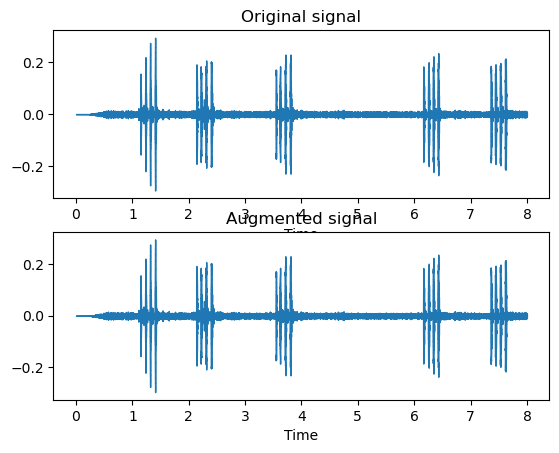

In [98]:
plot_signal(signal=sig, signal_aug=sig_aug_inv, sr=sr)

In [99]:
AudioI('data/augmented_signal_inv.wav')

In [101]:
sig_aug_gain = random_gain(signal=sig, min_gain=2, max_gain=4) #1.5-3

In [102]:
sf.write("data/augmented_signal_gain.wav", sig_aug_pitch, sr)

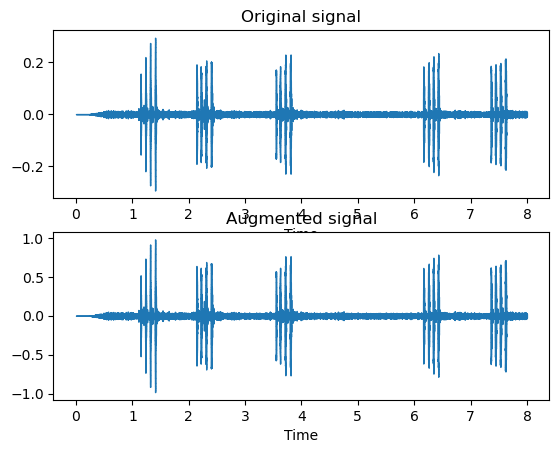

In [103]:
plot_signal(signal=sig, signal_aug=sig_aug_gain, sr=sr)

In [104]:
AudioI('data/augmented_signal_gain.wav')

In [36]:
# sig_aug = time_stretch(signal=sig, rate=0.9)
# sig_aug = pitch_scale(signal=sig_aug, sr=sr, n_steps=1.5)
# sig_aug = random_gain(signal=sig_aug, min_gain=1.2, max_gain=2)
# sig_aug = white_noise(signal=sig_aug, noise_factor=0.1) 
#sig_aug = polarity_inversion(signal=sig_aug)

sig_aug = time_stretch(signal=sig)
sig_aug = pitch_scale(signal=sig_aug, sr=sr)
sig_aug = random_gain(signal=sig_aug)
sig_aug = white_noise(signal=sig_aug) 
sig_aug = polarity_inversion(signal=sig_aug)

In [37]:
sf.write("data/augmented_signal_all.wav", sig_aug, sr)

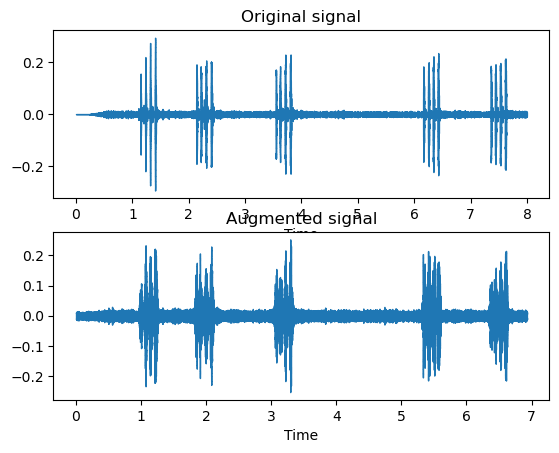

In [38]:
plot_signal(signal=sig, signal_aug=sig_aug, sr=sr)

In [39]:
AudioI(audio_file)

In [ ]:
AudioI('data/augmented_signal_all.wav')

In [41]:
sf.write("data/pure_signal.wav", sig, sr)

/opt/conda/lib/python3.10/site-packages/matplotlib/axes/_axes.py:7773: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


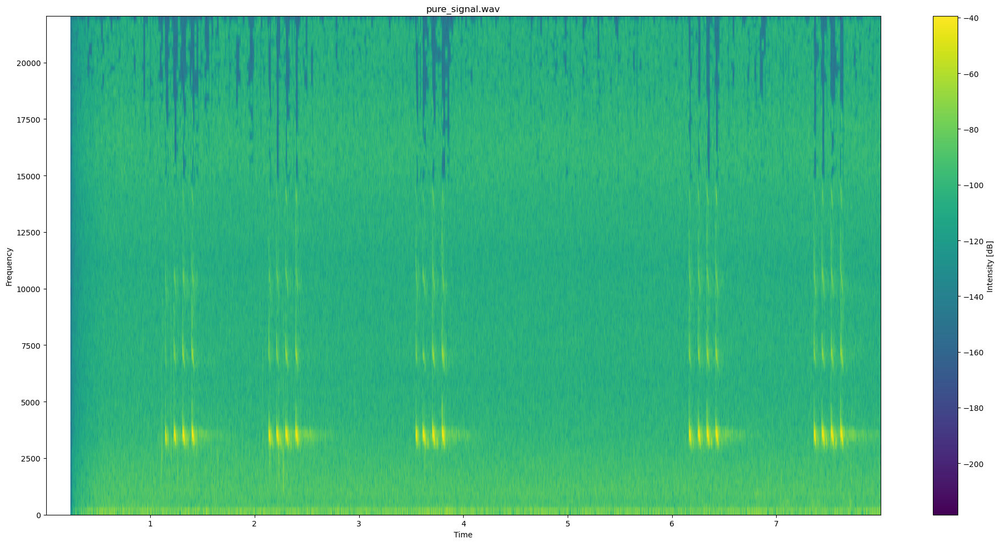

In [42]:
plot_spec(['data/pure_signal.wav'])

In [ ]:
# sig_aug = librosa.effects.time_stretch(y=sig, rate=0.9)
# sig_aug= librosa.effects.pitch_shift(y=sig_aug, sr=sr, n_steps=1.5)
# sig_aug = random_gain(signal=sig_aug, min_gain=1.2, max_gain=2)
# sig_aug = white_noise(signal=sig_aug, noise_factor=0.1) 
# sig_aug = librosa.effects.time_stretch(y=sig, rate=1.5)
# sig_aug= librosa.effects.pitch_shift(y=sig_aug, sr=sr, n_steps=2)
# sig_aug = random_gain(signal=sig_aug, min_gain=1.2, max_gain=4)
# sig_aug = white_noise(signal=sig_aug, noise_factor=0.4) 
# sig_aug = polarity_inversion(signal=sig_aug)

In [194]:

sig_aug = time_stretch(signal=sig)
sig_aug = pitch_scale(signal=sig_aug, sr=sr)
sig_aug = random_gain(signal=sig_aug)
sig_aug = white_noise(signal=sig_aug) 
sig_aug = polarity_inversion(signal=sig_aug)

In [196]:
sf.write("data/augmented_signal_all.wav", sig_aug, sr)

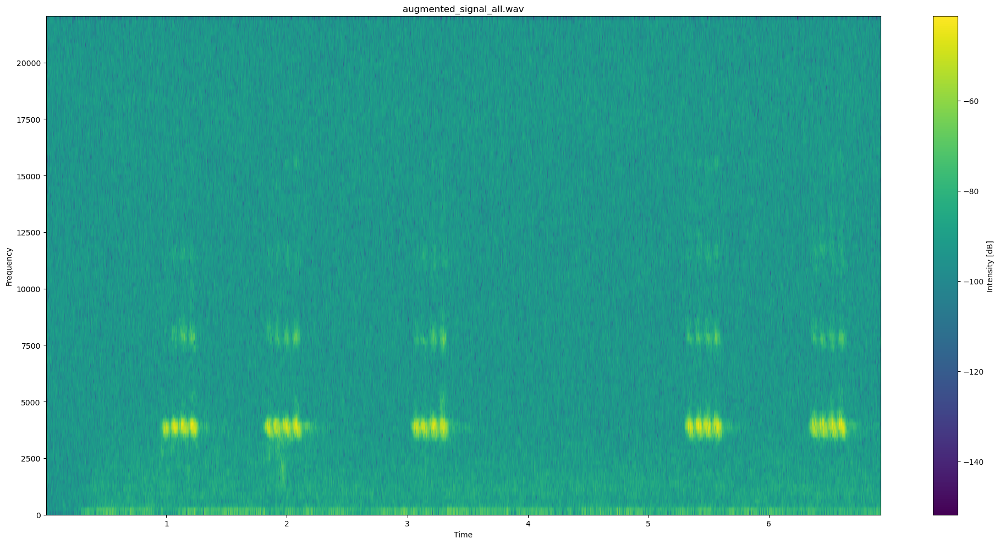

In [43]:
plot_spec(['data/augmented_signal_all.wav'])

In [23]:
def plot_spec2(files, tr=None):
    """
    Plot spectrograms of audio files.

    Args:
        files (List[str]): A list of file paths to audio files.

    Raises:
        AssertionError: If files is not a list.

    Returns:
        None
    """
    assert isinstance(files, list), 'Files must be passed as a list of paths'

    num_files = len(files)
    rows = math.ceil(num_files / 2)
    cols = min(num_files, 2)
    figure, axes = plt.subplots(rows, cols, figsize=(20, rows * 10 / cols), squeeze=False)
    figure.tight_layout()

    for ax, file in zip(axes.flat, files):
        waveform, sample_rate = torchaudio.load(file)
        wave = waveform[0]
        if tr == 'log':
            wave = np.log(np.maximum(wave, np.zeros(wave.shape)+0.01))  
        if tr == 'exp':  
            wave = np.exp(np.maximum(wave, np.zeros(wave.shape)+0.01)) 
        spectrum, freqs, t, im = ax.specgram(wave, Fs=sample_rate)
        ax.set_title(file.split('/')[-1])
        ax.set_xlabel("Time")
        ax.set_ylabel("Frequency")
        plt.colorbar(im).set_label('Intensity [dB]')
    
    if num_files>1 & num_files%2!=0:
        figure.delaxes(axes.flat[-1])

    plt.tight_layout()
    plt.show()


In [32]:
x = np.array([[1,2,3], [4,5,6]])
np.log(np.maximum(x,np.zeros(x.shape)+10.1))

array([[2.31253542, 2.31253542, 2.31253542],
       [2.31253542, 2.31253542, 2.31253542]])

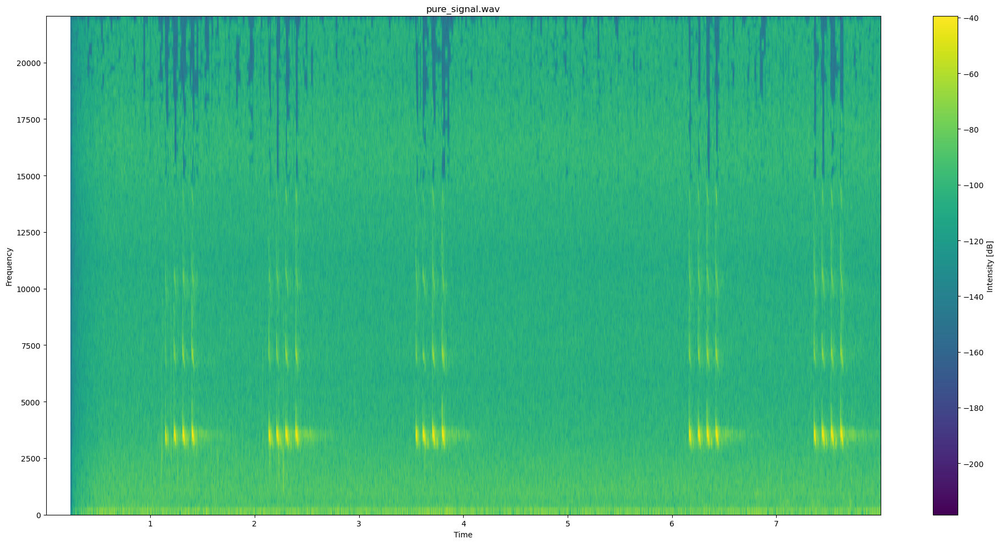

In [47]:
plot_spec2(['data/pure_signal.wav'])

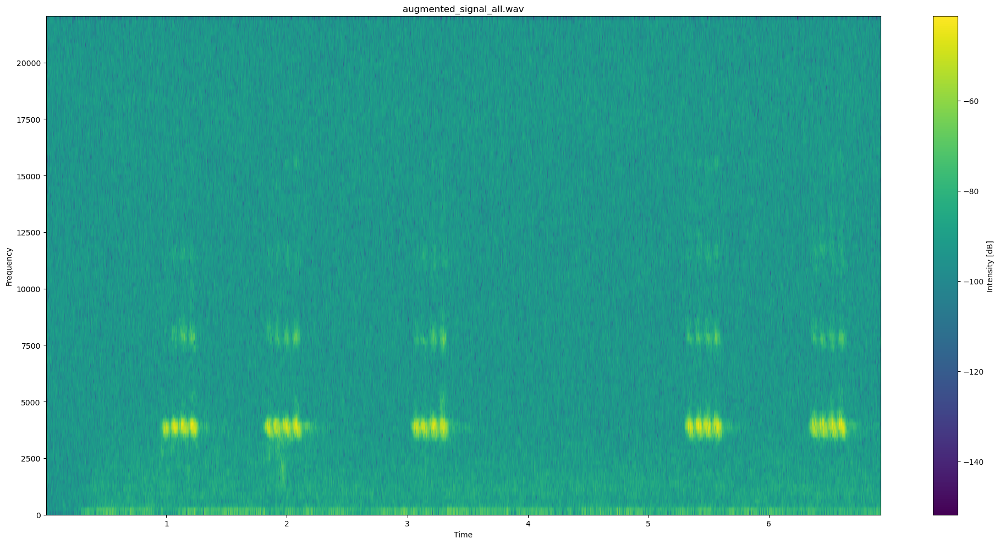

In [44]:
plot_spec2(['data/augmented_signal_all.wav'])

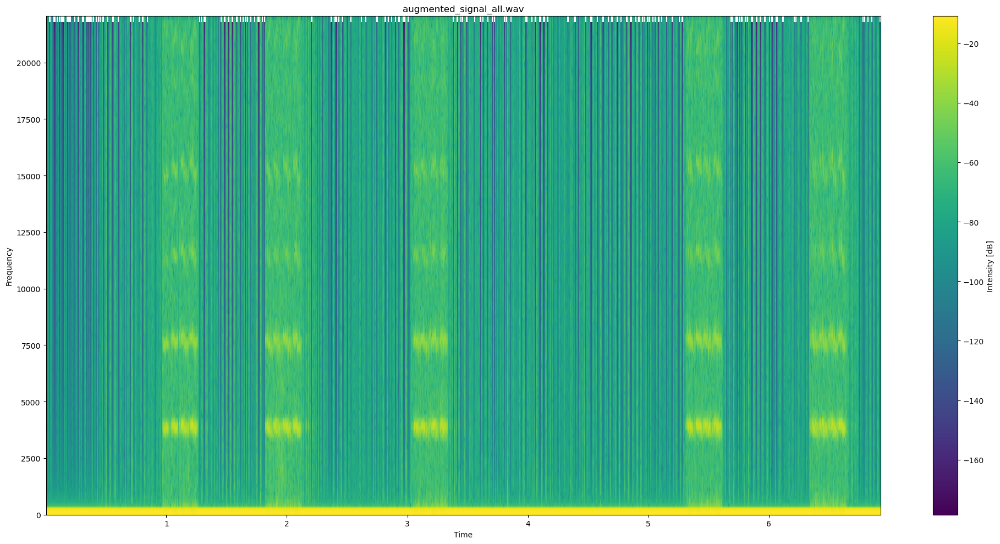

In [45]:
plot_spec2(['data/augmented_signal_all.wav'], tr='log')

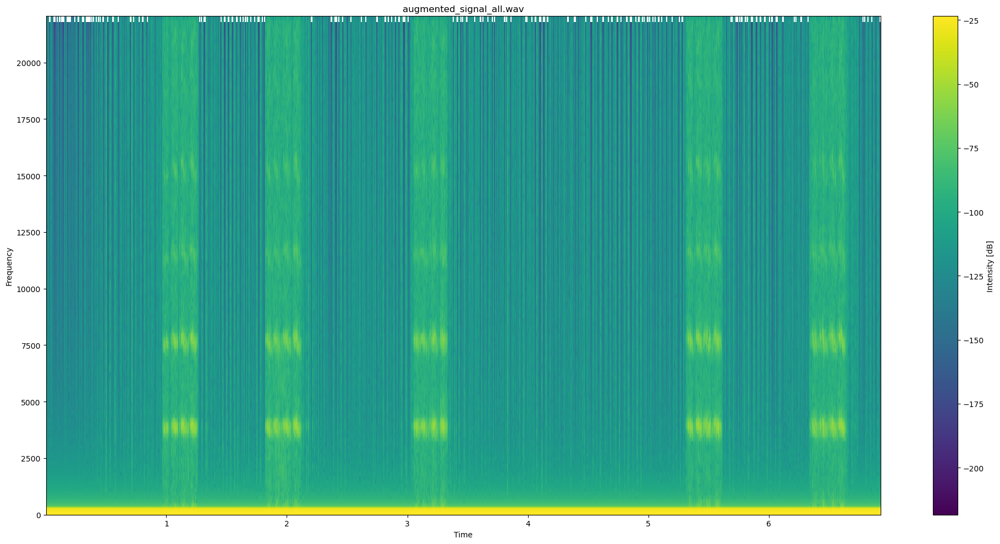

In [46]:
plot_spec2(['data/augmented_signal_all.wav'], tr='exp')

In [124]:
pitch_pm = 2
pitch_change =  pitch_pm * 2*(np.random.uniform())   
pitch_change

2.739318954339453

In [127]:
np.random.seed(123) 
for i in range(5):
    np.random.seed(123) 
    x = np.random.uniform()
    y = np.random.uniform()
    z = np.random.uniform()
    print(x+y+z)

1.2094599741124443
1.2094599741124443
1.2094599741124443
1.2094599741124443
1.2094599741124443


In [122]:
x = np.random.uniform()
y = np.random.uniform()
z = np.random.uniform()
x+y+z

1.6938901989929152

In [158]:
np.random.seed(123) 
aug_selection = np.sort(np.random.choice(5, size=np.random.randint(1,5), replace=False)+1)
bugs_aug = np.random.choice(5, size=2, replace=True)

array([2, 4])

In [90]:
np.random.choice(5, size=1, replace=False)

array([3])

In [ ]:
sig_aug = librosa.effects.time_stretch(y=sig, rate=1.2) #0.8-1.2
sig_aug= librosa.effects.pitch_shift(y=sig_aug, sr=sr, n_steps=1.5)  #1-2
sig_aug = random_gain(signal=sig_aug, min_gain=2, max_gain=4) #1.5-3
sig_aug = white_noise(signal=sig_aug, noise_factor=0.3)   #0.1-0.4
sig_aug = polarity_inversion(signal=sig_aug)

In [46]:
def augmentation(signal, seed, sr, strategy='few'):
    
    np.random.seed(seed) 
    if strategy == 'all':
        aug_selection = np.array([1,2,3,4,5])
    if strategy == 'few':
        aug_selection = np.sort(np.random.choice(5, size=np.random.randint(1,5), replace=False)+1)    
    elif strategy == 'one':
        aug_selection = np.sort(np.random.choice(5, size=1, replace=False)+1)
    signal_aug = signal.copy()
    for i in np.sort(aug_selection):
       # np.random.seed(seed) 
        if i == 1:
            signal_aug = time_stretch(signal=signal_aug, seed=seed) 
        if i == 2:
            signal_aug= pitch_scale(signal=signal_aug, sr=sr, seed=seed)  
        if i == 3:
            signal_aug = random_gain(signal=signal_aug, seed=seed)
        if i == 4:
            signal_aug = white_noise(signal=signal_aug, seed=seed)
        if i == 5:
            signal_aug = polarity_inversion(signal=signal_aug)            
    return  signal_aug   
            

In [47]:
#def generate_augmented_data(train_data, metadata, labels, path_out, fraction=0.5, seed=123):
def generate_augmented_data(train_data, metadata, dir_source, dir_dest, strategy='all', fraction=0.5, seed=123):    
    
    print('\n--------- copying basic train set ---------')  
    t = time.time()    
    shutil.copytree(dir_source + '/train', dir_dest + '/train')
    print('Elapsed time:', round(time.time() - t, 2))
    
    print('\n--------- copying validation set ---------')   
    t = time.time()    
    shutil.copytree(dir_source + '/val', dir_dest + '/val')
    print('Elapsed time:', round(time.time() - t, 2))    
 
    print('\n--------- copying test set ---------')  
    t = time.time()    
    shutil.copytree(dir_source + '/test', dir_dest + '/test')
    print('Elapsed time:', round(time.time() - t, 2))
    
    
    sr = train_data[0]['audio']['sampling_rate']
    
    print('\n--------- data preprocessing stage ---------')
    t = time.time()
    path_train_data = [train_data[i]['audio']['path'] for i in range(train_data.shape[0])]
    path_train_data = np.array(path_train_data)
    # if isinstance(metadata, str):
    #     metadata = pd.read_csv(metadata)
    df_audio = metadata[metadata.subset=='train']
    df_audio = df_audio.assign(path_full_raw = '/root/data/' + df_audio.path)
    df_audio = df_audio.assign(audio_rank_id = (df_audio.groupby('label')['file_name'].rank(method='first', na_option = 'bottom')-1).astype(int))

    df_audio_agg = df_audio.label.value_counts().reset_index(name='count').sort_values(by='label').reset_index(drop=True)
    count_max = df_audio_agg['count'].max()
    threshold = np.floor(count_max * fraction)
    df_audio_agg['gap'] = np.where((threshold - df_audio_agg['count']) > 0, (threshold - df_audio_agg['count']).astype(int), 0)
    df_audio_agg = df_audio_agg[df_audio_agg.gap > 0]

    label = []
    rank_id = []
    for l, c, g in zip(df_audio_agg['label'], df_audio_agg['count'], df_audio_agg['gap']):
        np.random.seed(seed) 
        ind = np.random.choice(c, size=g, replace=True)
        label.extend([l] * len(ind))
        rank_id.extend(ind)
    df_aug = pd.DataFrame(dict(label=label, audio_rank_id=rank_id))
    df_aug = df_aug.assign(rank_id = (df_aug.groupby(['label', 'audio_rank_id'])['audio_rank_id'].rank(method='first', na_option = 'bottom')-1).astype(int))
    
    df_aug_final = pd.merge(df_audio, df_aug, on=['label', 'audio_rank_id'], how='inner')
    df_aug_final = df_aug_final.assign(file_name = df_aug_final.file_name.apply(lambda x: x.split('.wav')[0]) + '_aug' + df_aug_final.rank_id.astype(str) + '.wav')    
    df_aug_final = df_aug_final.assign(path = 'data/train/' + df_aug_final.file_name)  
    print('Elapsed time:', round(time.time() - t, 2))
    
    
    print('\n--------- augmentation stage ---------')    
    t = time.time()
    for row, (p, f) in enumerate(zip(df_aug_final.path_full_raw.iloc, df_aug_final.file_name.iloc)):
        i = int(np.where(path_train_data == p)[0][0])
       # print(p, i)
        sig_aug =  augmentation(signal=train_data[i]['audio']['array'], seed=123, sr=sr, strategy=strategy)   
        # df_aug_final['num_frames'].iloc[row] = sig_aug.shape[0]
        # df_aug_final['length'].iloc[row] = sig_aug.shape[0]/sr
        
        df_aug_final.iat[row, df_aug_final.columns.get_loc('num_frames')] = sig_aug.shape[0]  
        df_aug_final.iat[row, df_aug_final.columns.get_loc('length')] = sig_aug.shape[0]/sr
        sf.write(dir_dest + '/train/' + f, sig_aug, sr)
    #time.time() - t     
    metadata_aug = pd.concat([metadata, df_aug_final[['file_name', 'unique_file', 'path', 'species', 'label', 'subset', 'sample_rate', 'num_frames', 'length']]], axis=0)
    metadata_aug.to_csv(dir_dest + 'metadata.csv', index=False)
    metadata_aug[metadata_aug.subset == 'train'][['file_name', 'label']].to_csv(dir_dest + '/train/' + 'metadata.csv', index=False)
    shutil.copyfile(dir_source + 'labels.json', dir_dest + 'labels.json')
    print('Elapsed time:', round(time.time() - t, 2))
    
    aug_summary = metadata_aug[metadata_aug.subset == 'train'].label.value_counts().reset_index().sort_values(by='label').reset_index(drop=True)
    aug_summary.to_csv(dir_dest + 'aug_summary.csv', index=False)
    

In [28]:
l=0
for file_name in os.listdir('/root/data/data/augmented_strategy_one/train'):
    l +=1
l    

3382

In [27]:
generate_augmented_data(train_data=train_dataset, 
                        metadata=metadata, 
                        dir_source='/root/data/data/', 
                        dir_dest='/root/data/data/augmented_strategy_one/', 
                        strategy='one',
                        fraction=0.5, 
                        seed=123)


--------- copying basic train set ---------
Elapsed time: 125.95712089538574

--------- copying validation set ---------
Elapsed time: 43.607869386672974

--------- copying test set ---------
Elapsed time: 39.32028889656067

--------- data preprocessing stage ---------
Elapsed time: 45.05792212486267

--------- augmentation stage ---------
Elapsed time: 2212.7808775901794


In [18]:
upload_to_s3(local_path=f'/root/data/data/augmented_strategy_one/labels.json',
             s3_path=f'data_augmented_strategy_one/labels.json',
             bucket='sagemaker-us-east-1-292159885427')

's3://sagemaker-us-east-1-292159885427/data_augmented_strategy_one/labels.json'

In [19]:
for path, directories, files in os.walk('/root/data/data/augmented_strategy_one/train'):
    for file in files:
        if file != 'metadata-checkpoint.csv':
            upload_to_s3(local_path=f'/root/data/data/augmented_strategy_one/train/{file}',
                         s3_path=f'data_augmented_strategy_one/train/{file}',
                         bucket='sagemaker-us-east-1-292159885427')

In [21]:
for path, directories, files in os.walk('/root/data/data/augmented_strategy_one/val'):
    for file in files:
        upload_to_s3(local_path=f'/root/data/data/augmented_strategy_one/val/{file}',
                     s3_path=f'data_augmented_strategy_one/val/{file}',
                     bucket='sagemaker-us-east-1-292159885427')

In [22]:
for path, directories, files in os.walk('/root/data/data/augmented_strategy_one/test'):
    for file in files:
        upload_to_s3(local_path=f'/root/data/data/augmented_strategy_one/test/{file}',
                     s3_path=f'data_augmented_strategy_one/test/{file}',
                     bucket='sagemaker-us-east-1-292159885427')

In [48]:
generate_augmented_data(train_data=train_dataset, 
                        metadata=metadata, 
                        dir_source='/root/data/data/', 
                        dir_dest='/root/data/data/augmented_strategy_few/', 
                        fraction=0.5, 
                        seed=123)


--------- copying basic train set ---------
Elapsed time: 103.86

--------- copying validation set ---------
Elapsed time: 39.23

--------- copying test set ---------
Elapsed time: 36.86

--------- data preprocessing stage ---------
Elapsed time: 28.43

--------- augmentation stage ---------
Elapsed time: 3612.18


In [50]:
l=0
for file_name in os.listdir('/root/data/data/augmented_strategy_few/train'):
    l +=1
l    

3382

In [49]:
upload_to_s3(local_path=f'/root/data/data/augmented_strategy_few/labels.json',
             s3_path=f'data_augmented_strategy_few/labels.json',
             bucket='sagemaker-us-east-1-292159885427')

's3://sagemaker-us-east-1-292159885427/data_augmented_strategy_few/labels.json'

In [51]:
for path, directories, files in os.walk('/root/data/data/augmented_strategy_few/train'):
    for file in files:
        if file != 'metadata-checkpoint.csv':
            upload_to_s3(local_path=f'/root/data/data/augmented_strategy_few/train/{file}',
                         s3_path=f'data_augmented_strategy_few/train/{file}',
                         bucket='sagemaker-us-east-1-292159885427')

In [52]:
for path, directories, files in os.walk('/root/data/data/augmented_strategy_few/val'):
    for file in files:
        upload_to_s3(local_path=f'/root/data/data/augmented_strategy_few/val/{file}',
                     s3_path=f'data_augmented_strategy_few/val/{file}',
                     bucket='sagemaker-us-east-1-292159885427')

In [53]:
for path, directories, files in os.walk('/root/data/data/augmented_strategy_few/test'):
    for file in files:
        upload_to_s3(local_path=f'/root/data/data/augmented_strategy_few/test/{file}',
                     s3_path=f'data_augmented_strategy_few/test/{file}',
                     bucket='sagemaker-us-east-1-292159885427')

In [7]:
#metadata = pd.read_csv('/root/data/data/metadata.csv')

In [103]:
#train_dataset = load_dataset("audiofolder", data_dir='data/augmented_strategy_one/train').get('train')

In [ ]:
%pip install tensorflow

In [20]:
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_io as tfio

ModuleNotFoundError: No module named 'tensorflow'

In [23]:
from models.MobileNetV3 import get_model

ModuleNotFoundError: No module named 'models.MobileNetV3'

In [55]:
# for path, directories, files in os.walk('/root/data/data/val'):
#     for file in tqdm(files):
#         upload_to_s3(local_path=f'/root/data/data/val/{file}',
#                      s3_path=f'data_augmented/val/{file}',
#                      bucket='sagemaker-us-east-1-292159885427')

2it [02:13, 66.89s/it] 
